In [1]:
%run ../../color2/CycleGAN-keras-color-Copy2.ipynb

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
using multiple gpus
not using multiple gpu
using multiple gpus
not using multiple gpu
loaded from .h5 files


In [2]:
# image directory from which to stylize. Must be image, any format that PIL can handle will work. 
# will be downsized to 256x256
image_dir = '../../famous_paintings/*'
inputs = load_data(image_dir)

In [3]:
def read_image(filename, is_input=False, grayscale_input=True):
    # grayscale input should be used in color1, color2, color3
    # o.w. set to false
    
    im = Image.open(filename).convert('RGB')
    im = im.resize( (256, 256), Image.BILINEAR )
    arr = np.array(im).astype(float)
    img=arr/255*2-1
        
    # grayscale input
    if is_input and grayscale_input:
        img = np.maximum(np.maximum(img[:,:,2],img[:, :,1]), img[:,:,0])
        img = np.broadcast_to(img[...,None],img.shape+(3,))
        
    return img

In [4]:
def read(inputs):
    # inputs should be a list of valid jpg images
    rtn = [np.float32(read_image(inp)) for inp in inputs]
    return rtn

In [5]:
from IPython.display import display
def showX(X, rows=1):
    #assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).astype('uint8')
    int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize, imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    display(Image.fromarray(int_X))
    
def showGen(A):
    def G(fn_generate, X):
        r = np.array([fn_generate([X[i:i+1]]) for i in range(X.shape[0])])
        return r.swapaxes(0,1)[:,:,0]  
    rA = G(cycleA_generate, A)
    # inp image
    showX(A)
    showX(rA[0])

# Results - all

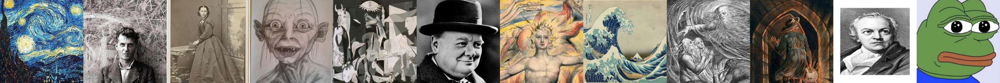

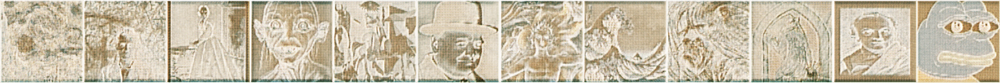

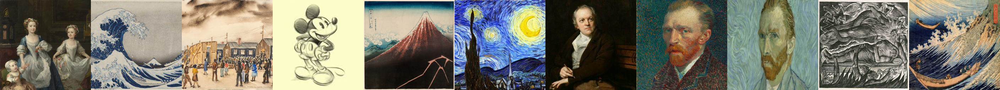

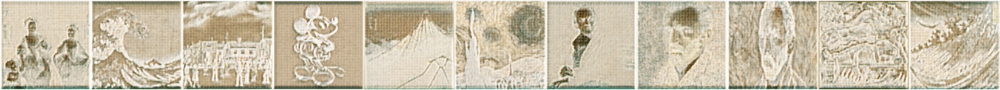

In [6]:
loaded_inputs = read(inputs)
showGen(np.array(loaded_inputs[:12]))
showGen(np.array(loaded_inputs[12:]))

# Results (Zoomed in)

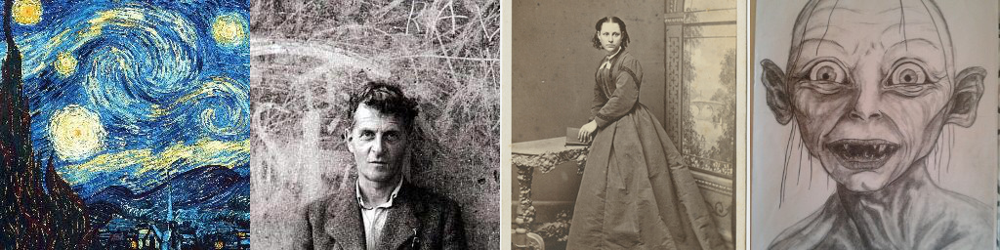

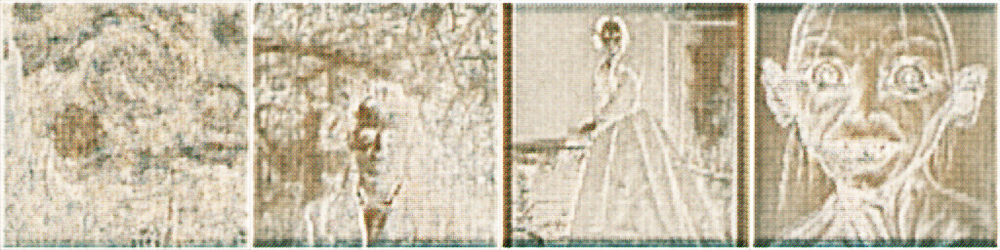

In [7]:
loaded_inputs = read(inputs)[0:4]
showGen(np.array(loaded_inputs))

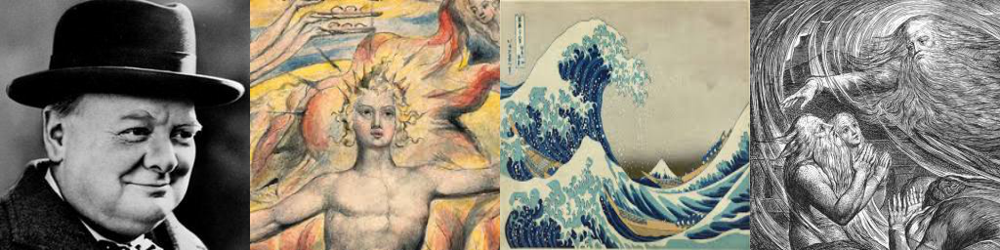

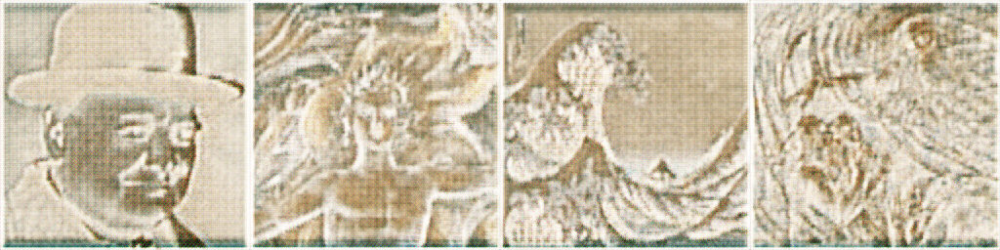

In [8]:
loaded_inputs = read(inputs)[5:9]
showGen(np.array(loaded_inputs))

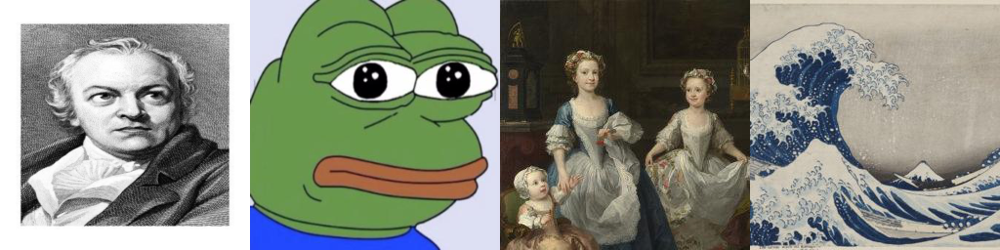

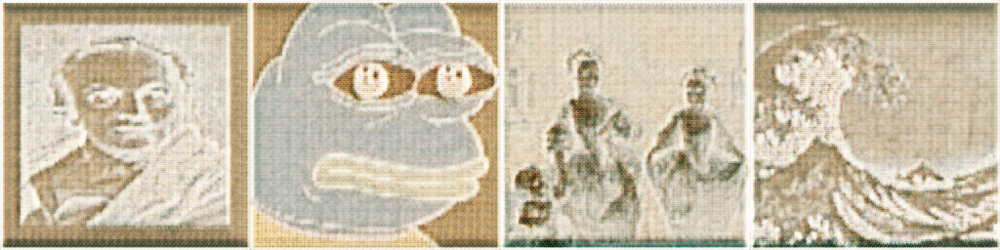

In [9]:
loaded_inputs = read(inputs)[10:14]
showGen(np.array(loaded_inputs))

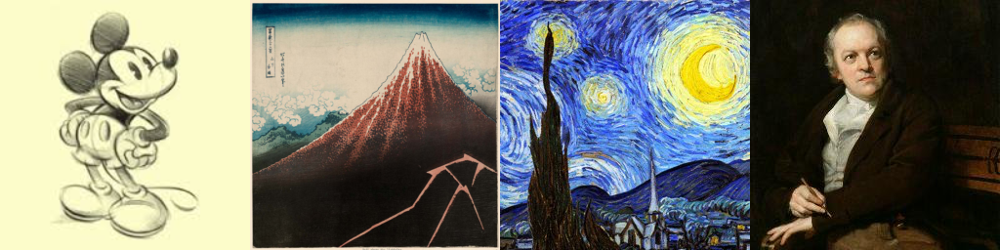

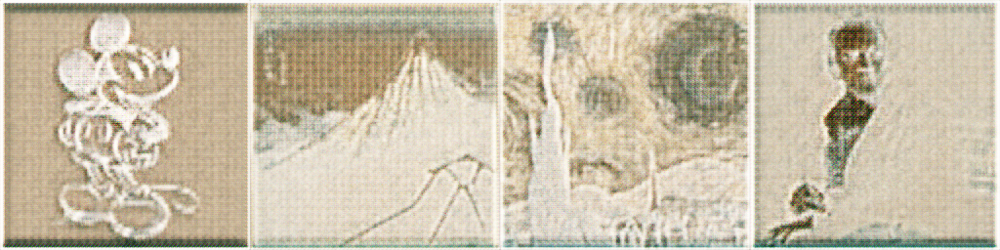

In [10]:
loaded_inputs = read(inputs)[15:19]
showGen(np.array(loaded_inputs))

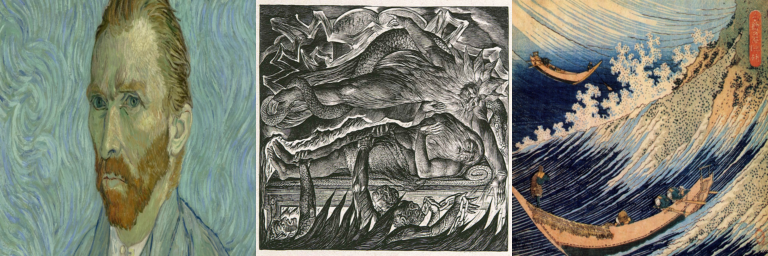

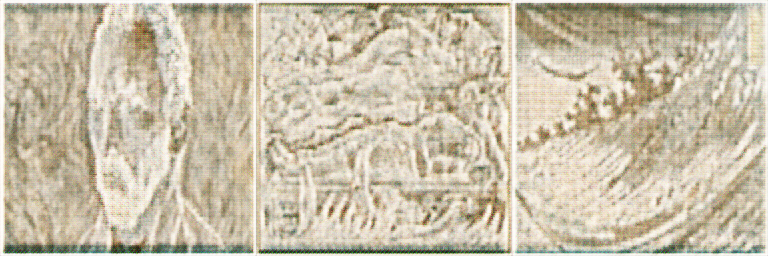

In [11]:
loaded_inputs = read(inputs)[20:]
showGen(np.array(loaded_inputs))

# hand picked result:

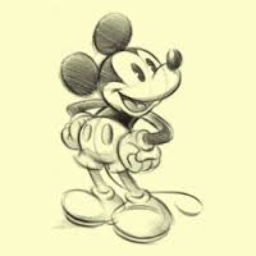

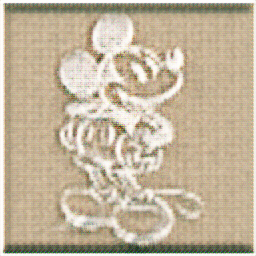

In [12]:
loaded_inputs = read(inputs)[15]
showGen(np.array([loaded_inputs]))

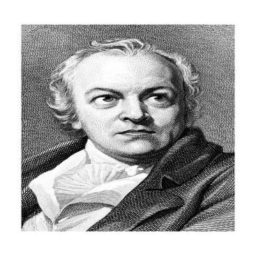

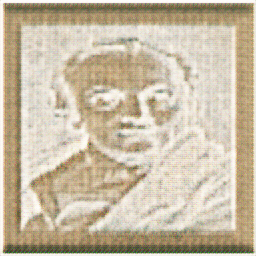

In [13]:
loaded_inputs = read(inputs)[10]
showGen(np.array([loaded_inputs]))

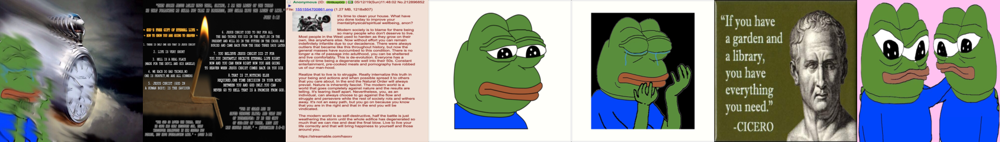

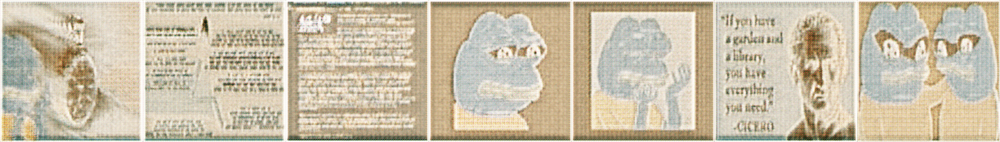

In [24]:
image_dir = '../../for_fun/*'
inputs = load_data(image_dir)

loaded_inputs = read(inputs)
showGen(np.array(loaded_inputs))